<a href="https://colab.research.google.com/github/Huicccc/AI-Python/blob/main/FacesWGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install wandb qqq

In [ ]:
import torch
import torchvision
import os
import PIL
import pdb
from torch import nn
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.utils import make_grid
from tqdm.auto import tqdm
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import wandb
wandb.login(key='')


def show(tensor, num=25, wandbactive=0, name=''):
    data = tensor.detach().cpu()
    grid = make_grid(data[:num], nrow=5).permute(1, 2, 0)

    # https://wandb.ai
    if (wandbactive == 1):
        wandb.log({name: wandb.Image(grid.numpy().clip(0, 1))})

    plt.imshow(grid.clip(0, 1))
    plt.show()


# hyperparameters and general parameters
n_epochs = 10000
batch_size = 128
lr = 1e-4
z_dim = 200
device = 'cuda'  # GPU

cur_step = 0
crit_cycles = 5  # 5 critic 1 generator
gen_losses = []
crit_losses = []
show_step = 35
save_step = 35

wandbact = 1  # track stats through weights and biases


In [ ]:
# capture
experiment_name = wandb.util.generate_id()

myrun = wandb.init(
    project="wgan",
    group=experiment_name,
    config={
        "optimizer": "adam",
        "model": "wgan gp",
        "epoch": "1000",
        "batch_size": 128
    }
)

config = wandb.config

In [6]:
# generator

class Generator(nn.Module):
    def __init__(self, z_dim=64, d_dim=16):
        super(Generator, self).__init__()
        self.z_dim = z_dim

        self.gen = nn.Sequential(
            # ConvTranspose2d: in_channels, out_channels, kernel_size, stride=1, padding=0
            # Calculating new width and height: (n-1)*stride -2*padding +ks
            # n = width or height
            # ks = kernel size
            # begin with a 1x1 image with z_dim number of channels (200)
            nn.ConvTranspose2d(z_dim, d_dim * 32, 4, 1,
                               0),  # 4x4 (ch: 200, 512)
                               # (n-1)*stride -2*padding +ks = (1-1)*1-2*0+4= 4
            nn.BatchNorm2d(d_dim*32),
            nn.ReLU(True),

            nn.ConvTranspose2d(d_dim*32, d_dim*16, 4, 2,
                               1),  # 8x8 (ch: 512, 256)
            nn.BatchNorm2d(d_dim*16),
            nn.ReLU(True),

            nn.ConvTranspose2d(d_dim*16, d_dim*8, 4, 2,
                               1),  # 16x16 (ch: 256, 128)
            nn.BatchNorm2d(d_dim*8),
            nn.ReLU(True),

            nn.ConvTranspose2d(d_dim*8, d_dim*4, 4, 2,
                               1),  # 32x32 (ch: 128, 64)
            nn.BatchNorm2d(d_dim*4),
            nn.ReLU(True),

            nn.ConvTranspose2d(d_dim*4, d_dim*2, 4, 2,
                               1),  # 64x64 (ch: 64, 32)
            nn.BatchNorm2d(d_dim*2),
            nn.ReLU(True),

            nn.ConvTranspose2d(d_dim*2, 3, 4, 2, 1),  # 128x128 (ch: 32, 3)
            nn.Tanh()  # produce result in the range from -1 to 1
        )

    def forward(self, noise):
        x = noise.view(len(noise), self.z_dim, 1, 1)  # 128 x 200 x 1 x 1
        return self.gen(x)


def gen_noise(num, z_dim, device='cuda'):
    return torch.randn(num, z_dim, device=device)  # 128 x 200

In [7]:
# critic model

class Critic(nn.Module):
    def __init__(self, d_dim=16):
        super(Critic, self).__init__()

        self.crit = nn.Sequential(
            # Conv2d: in_channels, out_channels, kernel_size, stride=1, padding=0
            # New width and height: # (n+2*pad-ks)//stride +1
            # (n+2*pad-ks)//stride +1 = (128+2*1-4)//2+1=64x64 (ch: 3,16)
            nn.Conv2d(3, d_dim, 4, 2, 1),
            nn.InstanceNorm2d(d_dim),
            nn.LeakyReLU(0.2),

            nn.Conv2d(d_dim, d_dim*2, 4, 2, 1),  # 32x32 (ch: 16, 32)
            nn.InstanceNorm2d(d_dim*2),
            nn.LeakyReLU(0.2),

            nn.Conv2d(d_dim*2, d_dim*4, 4, 2, 1),  # 16x16 (ch: 32, 64)
            nn.InstanceNorm2d(d_dim*4),
            nn.LeakyReLU(0.2),

            nn.Conv2d(d_dim*4, d_dim*8, 4, 2, 1),  # 8x8 (ch: 64, 128)
            nn.InstanceNorm2d(d_dim*8),
            nn.LeakyReLU(0.2),

            nn.Conv2d(d_dim*8, d_dim*16, 4, 2, 1),  # 4x4 (ch: 128, 256)
            nn.InstanceNorm2d(d_dim*16),
            nn.LeakyReLU(0.2),

            # (n+2*pad-ks)//stride +1=(4+2*0-4)//1+1= 1X1 (ch: 256,1)
            nn.Conv2d(d_dim*16, 1, 4, 1, 0),

        )

    def forward(self, image):
        # image: 128 x 3 x 128 x 128
        crit_pred = self.crit(image)  # 128 x 1 x 1 x 1
        return crit_pred.view(len(crit_pred), -1)  # 128 x 1

In [ ]:
# load dataset
import gdown
import zipfile

url = 'https://drive.google.com/uc?id=0B7EVK8r0v71pZjFTYXZWM3FlRnM'
path = 'data/celeba'
download_path = f'{path}/img_align_celeba.zip'


if not os.path.exists(path):
    os.makedirs(path)

gdown.download(url, download_path, quiet=False)

with zipfile.ZipFile(download_path, 'r') as ziphandler:
    ziphandler.extractall(path)

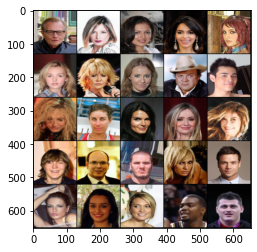

In [11]:
# Dataset
class Dataset(Dataset):
    def __init__(self, path, size=128, lim=10000):
        self.sizes = [size, size]
        items, labels = [], []

        for data in os.listdir(path)[:lim]:
            item = os.path.join(path, data)
            items.append(item)
            labels.append(data)
        self.items = items
        self.labels = labels

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        data = PIL.Image.open(self.items[idx]).convert('RGB')  # (178,218)
        data = np.asarray(torchvision.transforms.Resize(
            self.sizes)(data))  # 128 x 128 x 3
        data = np.transpose(data, (2, 0, 1)).astype(
            np.float32, copy=False)  # 3 x 128 x 128 # from 0 to 255
        data = torch.from_numpy(data).div(255)  # from 0 to 1
        return data, self.labels[idx]


data_path = './data/celeba/img_align_celeba'
ds = Dataset(data_path, size=128, lim=10000)

# DataLoader
dataloader = DataLoader(ds, batch_size=batch_size, shuffle=True)

# Models
gen = Generator(z_dim).to(device)
crit = Critic().to(device)

# Optimizers
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(0.5, 0.9))
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(0.5, 0.9))

# wandb optional
if (wandbact == 1):
    wandb.watch(gen, log_freq=100)
    wandb.watch(crit, log_freq=100)

x, y = next(iter(dataloader))
show(x)

In [12]:
# gradient penalty calculation

def get_gp(real, fake, crit, alpha, gamma=10):
    mix_images = real * alpha + fake * (1-alpha)  # 128 x 3 x 128 x 128
    mix_scores = crit(mix_images)  # 128 x 1

    gradient = torch.autograd.grad(
        inputs=mix_images,
        outputs=mix_scores,
        grad_outputs=torch.ones_like(mix_scores),
        retain_graph=True,
        create_graph=True,
    )[0]  # 128 x 3 x 128 x 128

    gradient = gradient.view(len(gradient), -1)   # 128 x 49152
    gradient_norm = gradient.norm(2, dim=1)
    gp = gamma * ((gradient_norm-1)**2).mean()

    return gp

In [13]:
# Save and load checkpoints

root_path = './data/'


def save_checkpoint(name):
    torch.save({
        'epoch': epoch,
        'model_state_dict': gen.state_dict(),
        'optimizer_state_dict': gen_opt.state_dict()
    }, f"{root_path}G-{name}.pkl")

    torch.save({
        'epoch': epoch,
        'model_state_dict': crit.state_dict(),
        'optimizer_state_dict': crit_opt.state_dict()
    }, f"{root_path}C-{name}.pkl")

    print("Saved checkpoint")


def load_checkpoint(name):
    checkpoint = torch.load(f"{root_path}G-{name}.pkl")
    gen.load_state_dict(checkpoint['model_state_dict'])
    gen_opt.load_state_dict(checkpoint['optimizer_state_dict'])

    checkpoint = torch.load(f"{root_path}C-{name}.pkl")
    crit.load_state_dict(checkpoint['model_state_dict'])
    crit_opt.load_state_dict(checkpoint['optimizer_state_dict'])

    print("Loaded checkpoint")

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  35 35
Saved checkpoint


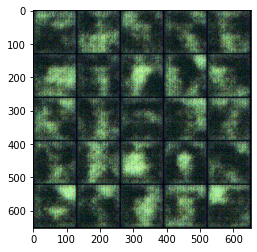

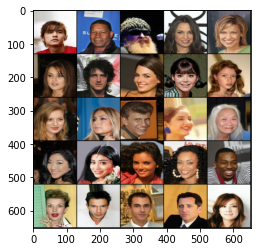

Epoch: 0: Step 35: Generator loss: 9.474882010902677, critic loss: -8.637073942252568


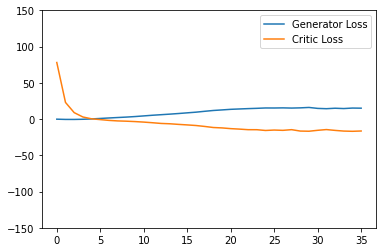

Saving checkpoint:  70 35
Saved checkpoint


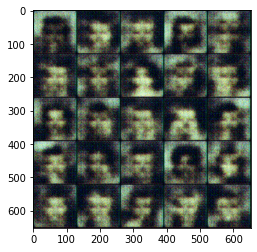

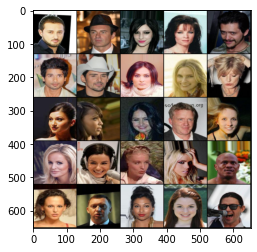

Epoch: 0: Step 70: Generator loss: 20.082871736798968, critic loss: -21.313806566510877


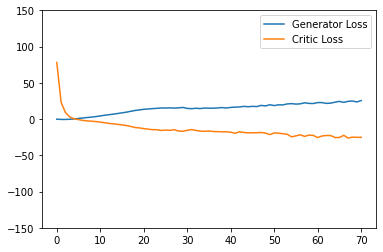

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  105 35
Saved checkpoint


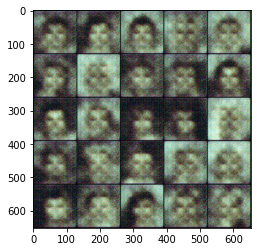

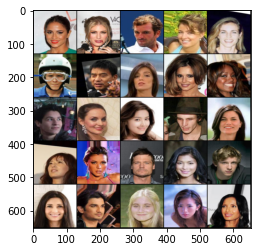

Epoch: 1: Step 105: Generator loss: 24.62222965785435, critic loss: -24.573147419520787


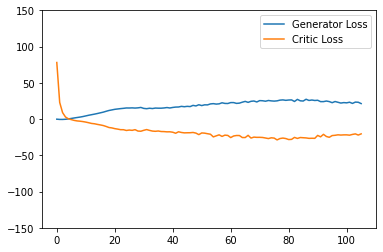

Saving checkpoint:  140 35
Saved checkpoint


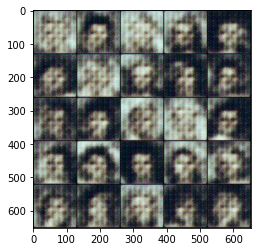

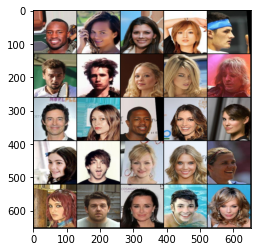

Epoch: 1: Step 140: Generator loss: 23.430522755214145, critic loss: -19.84898372650147


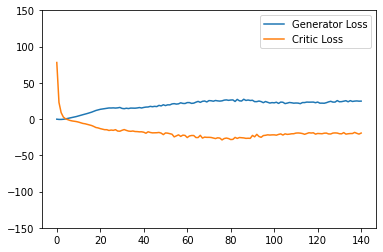

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  175 35
Saved checkpoint


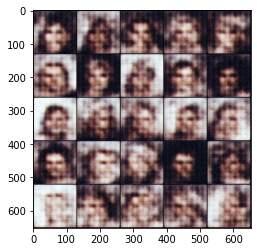

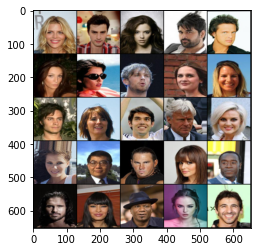

Epoch: 2: Step 175: Generator loss: 25.02106159755162, critic loss: -19.238895775931226


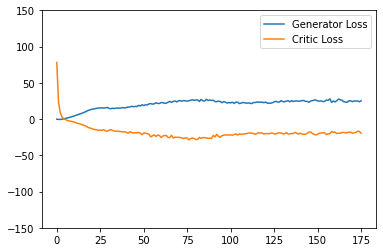

Saving checkpoint:  210 35
Saved checkpoint


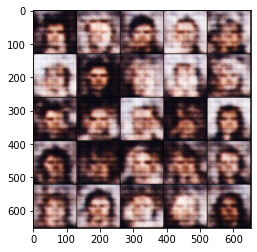

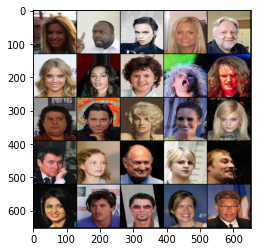

Epoch: 2: Step 210: Generator loss: 25.06532483782087, critic loss: -16.906224882943288


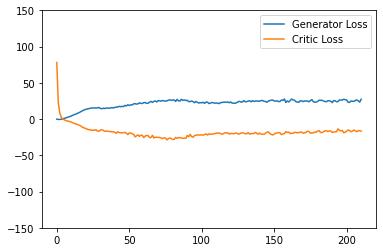

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  245 35
Saved checkpoint


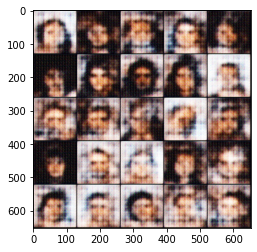

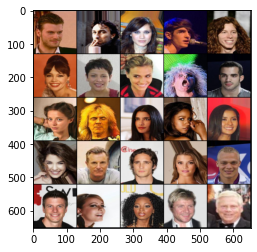

Epoch: 3: Step 245: Generator loss: 25.229897689819335, critic loss: -16.00009807041713


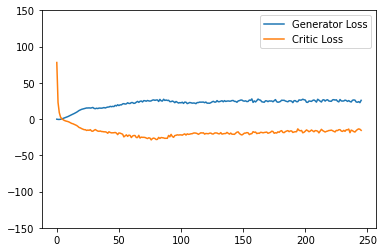

Saving checkpoint:  280 35
Saved checkpoint


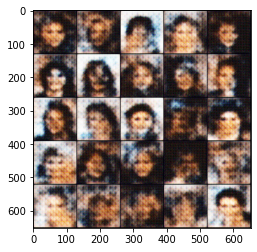

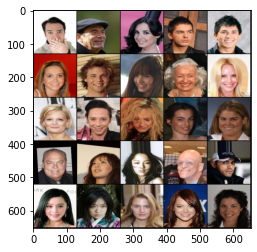

Epoch: 3: Step 280: Generator loss: 24.642767769949778, critic loss: -15.276902035304472


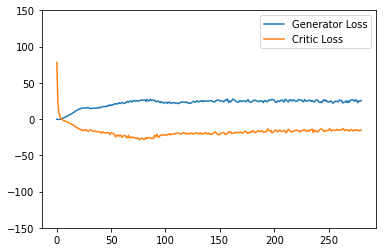

Saving checkpoint:  315 35
Saved checkpoint


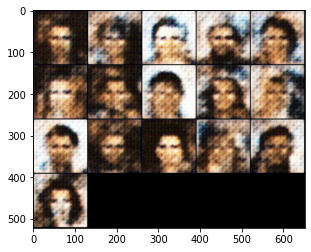

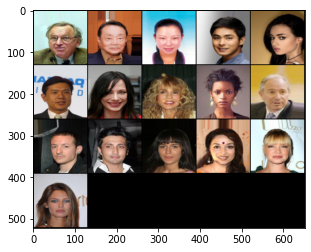

Epoch: 3: Step 315: Generator loss: 25.62284246172224, critic loss: -14.545796061924525


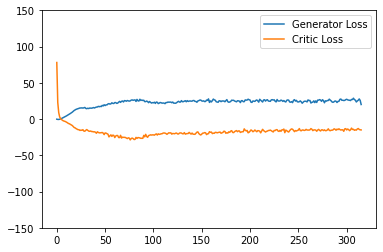

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  350 35
Saved checkpoint


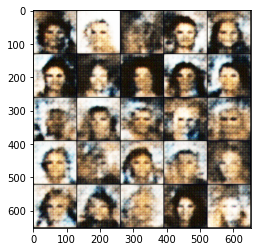

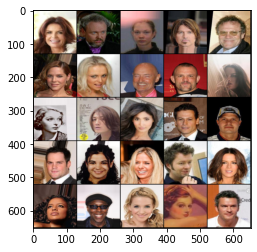

Epoch: 4: Step 350: Generator loss: 26.354975291660853, critic loss: -13.7826891708374


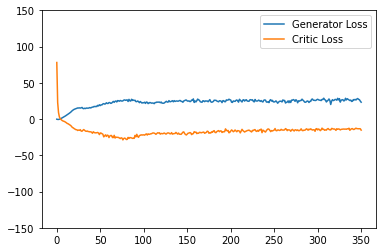

Saving checkpoint:  385 35
Saved checkpoint


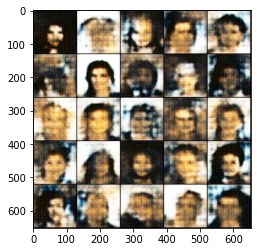

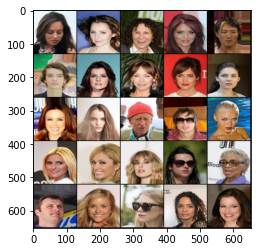

Epoch: 4: Step 385: Generator loss: 26.025486755371094, critic loss: -12.673840991428918


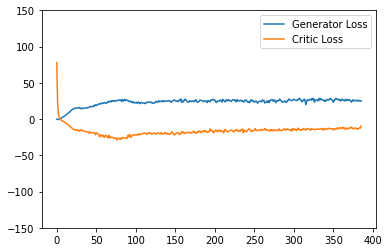

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  420 35
Saved checkpoint


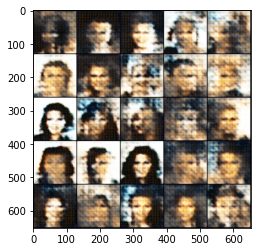

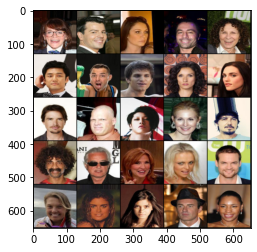

Epoch: 5: Step 420: Generator loss: 24.476753180367606, critic loss: -12.117381373814172


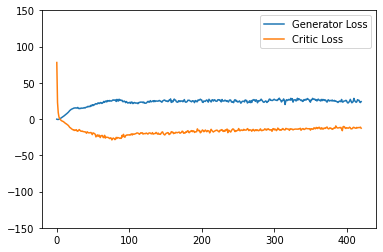

Saving checkpoint:  455 35
Saved checkpoint


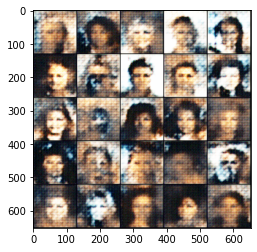

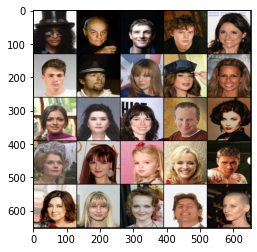

Epoch: 5: Step 455: Generator loss: 23.732728576660158, critic loss: -11.737017258235385


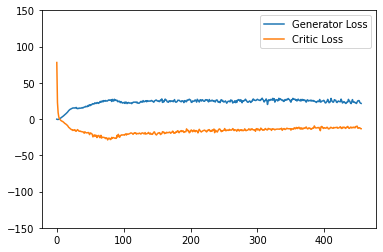

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  490 35
Saved checkpoint


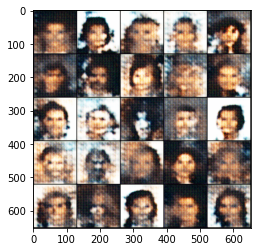

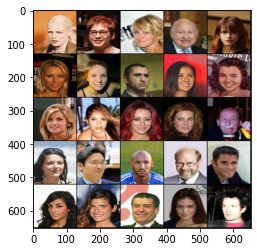

Epoch: 6: Step 490: Generator loss: 23.74365474155971, critic loss: -11.347126497541154


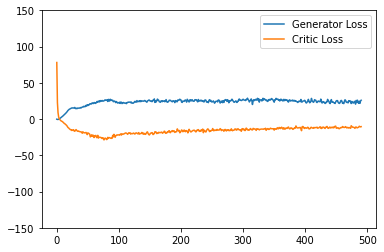

Saving checkpoint:  525 35
Saved checkpoint


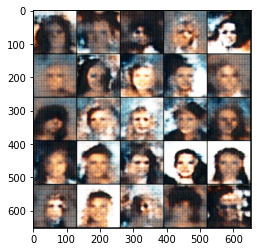

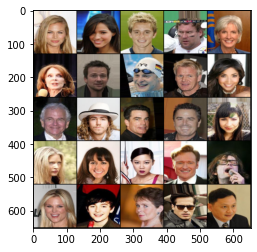

Epoch: 6: Step 525: Generator loss: 24.02124116080148, critic loss: -11.314543800354


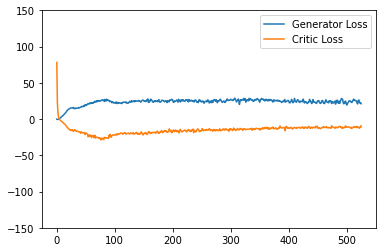

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  560 35
Saved checkpoint


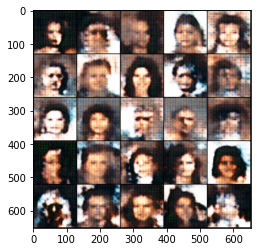

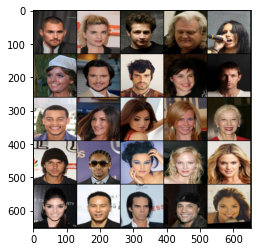

Epoch: 7: Step 560: Generator loss: 23.99592830113002, critic loss: -11.25470502308437


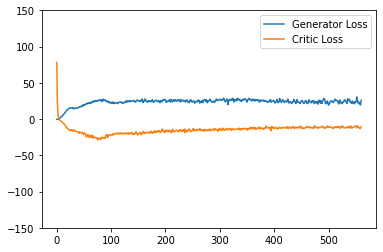

Saving checkpoint:  595 35
Saved checkpoint


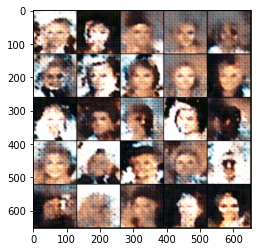

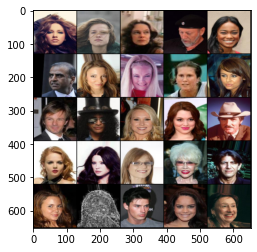

Epoch: 7: Step 595: Generator loss: 23.89329011099679, critic loss: -10.67706147875105


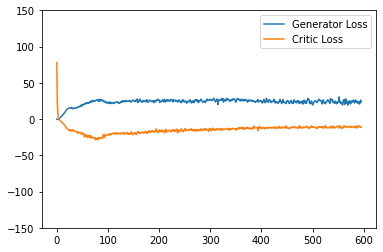

Saving checkpoint:  630 35
Saved checkpoint


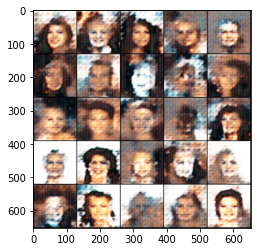

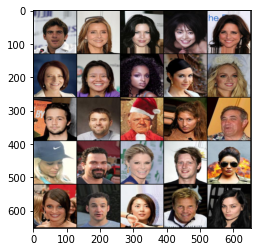

Epoch: 7: Step 630: Generator loss: 23.588096019199916, critic loss: -10.363809081486293


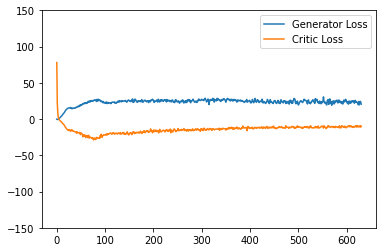

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  665 35
Saved checkpoint


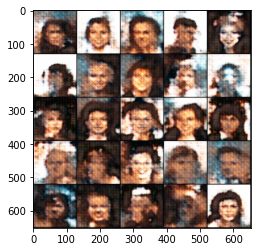

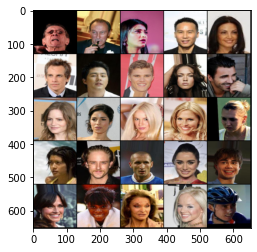

Epoch: 8: Step 665: Generator loss: 22.75563398088728, critic loss: -9.974662320273264


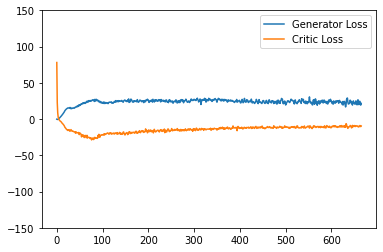

Saving checkpoint:  700 35
Saved checkpoint


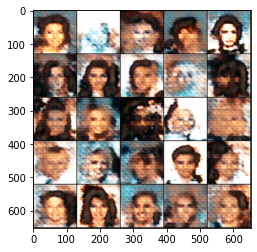

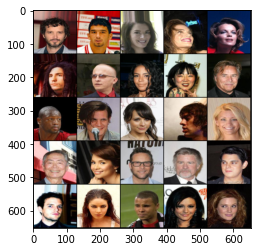

Epoch: 8: Step 700: Generator loss: 23.019253049577987, critic loss: -9.657411027635845


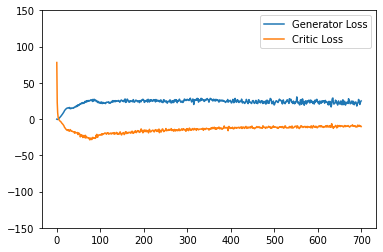

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  735 35
Saved checkpoint


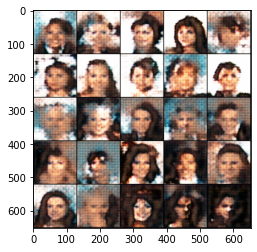

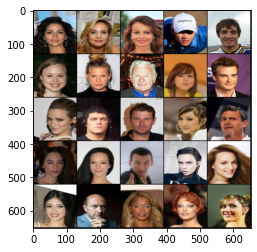

Epoch: 9: Step 735: Generator loss: 23.560740879603795, critic loss: -9.83407084601266


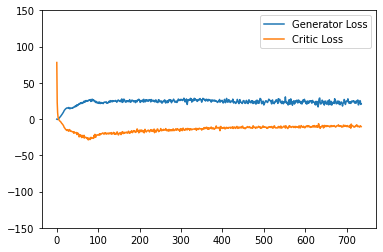

Saving checkpoint:  770 35
Saved checkpoint


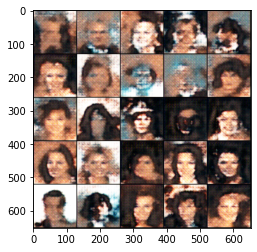

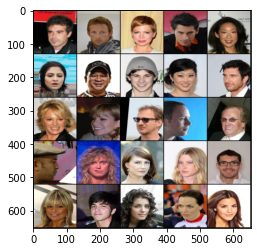

Epoch: 9: Step 770: Generator loss: 23.403845269339424, critic loss: -9.435089920588903


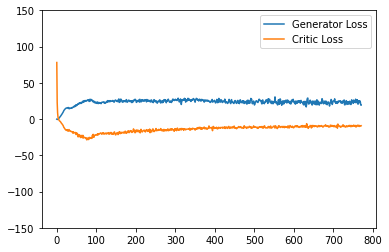

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  805 35
Saved checkpoint


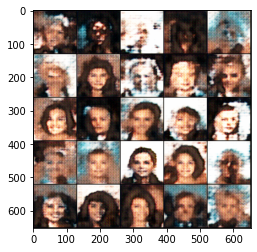

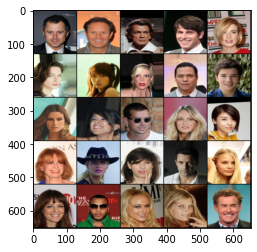

Epoch: 10: Step 805: Generator loss: 22.26844139099121, critic loss: -9.632221260070796


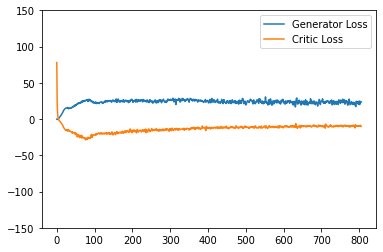

Saving checkpoint:  840 35
Saved checkpoint


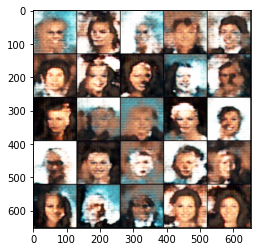

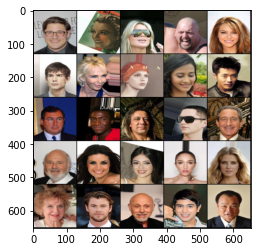

Epoch: 10: Step 840: Generator loss: 23.255590765816823, critic loss: -9.443215258462091


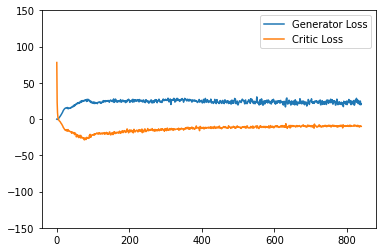

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  875 35
Saved checkpoint


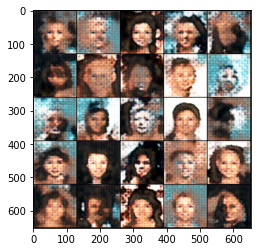

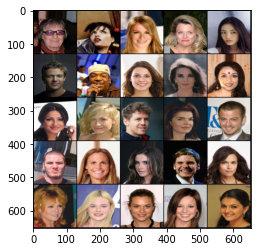

Epoch: 11: Step 875: Generator loss: 23.00976426260812, critic loss: -9.43992930003575


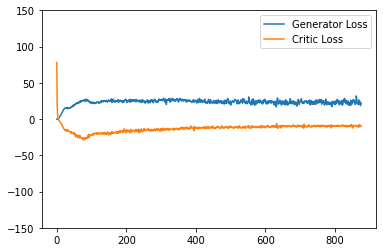

Saving checkpoint:  910 35
Saved checkpoint


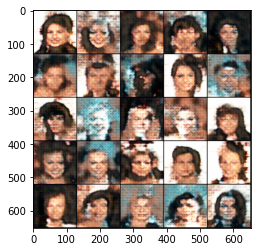

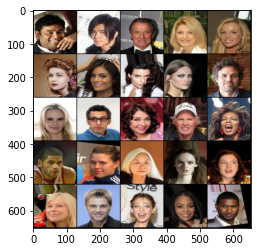

Epoch: 11: Step 910: Generator loss: 22.78650692531041, critic loss: -9.43622583116804


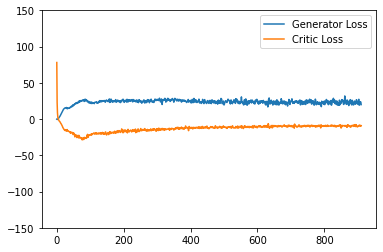

Saving checkpoint:  945 35
Saved checkpoint


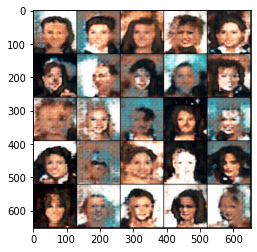

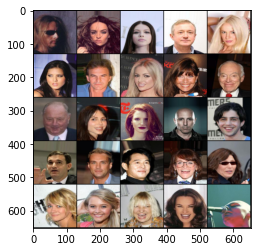

Epoch: 11: Step 945: Generator loss: 23.65229274204799, critic loss: -9.271652387891496


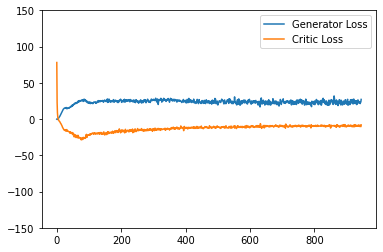

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  980 35
Saved checkpoint


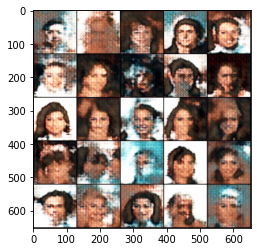

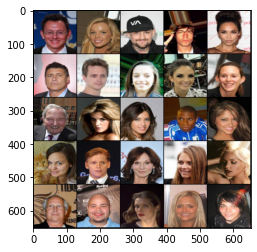

Epoch: 12: Step 980: Generator loss: 23.10900056021554, critic loss: -9.386145529065814


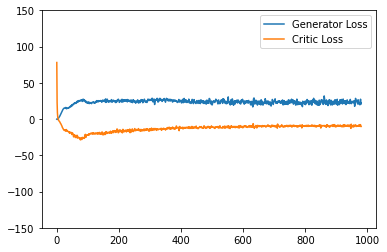

Saving checkpoint:  1015 35
Saved checkpoint


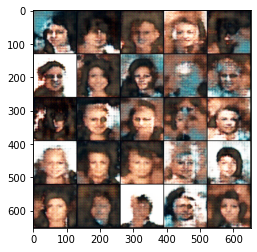

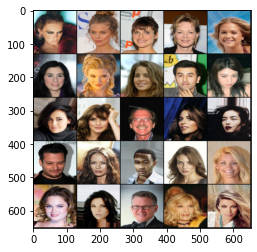

Epoch: 12: Step 1015: Generator loss: 24.247395052228654, critic loss: -9.267259837559292


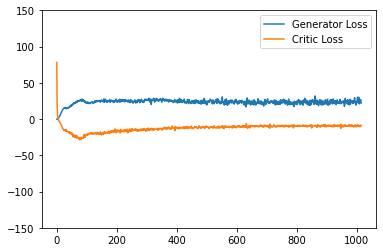

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  1050 35
Saved checkpoint


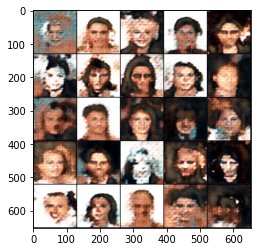

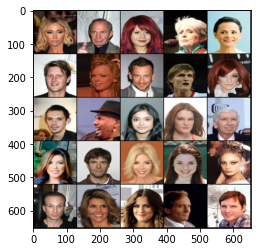

Epoch: 13: Step 1050: Generator loss: 22.867612620762415, critic loss: -9.089099953515188


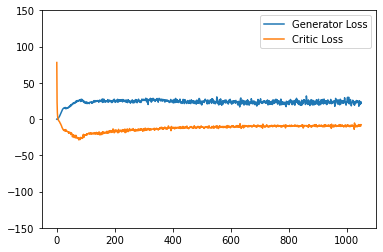

Saving checkpoint:  1085 35
Saved checkpoint


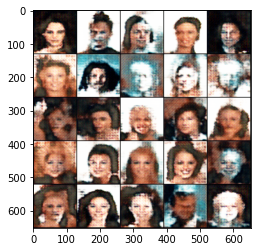

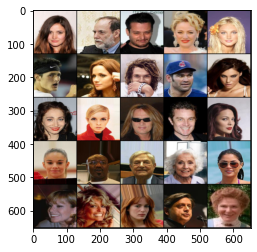

Epoch: 13: Step 1085: Generator loss: 24.132266453334264, critic loss: -8.898738594055175


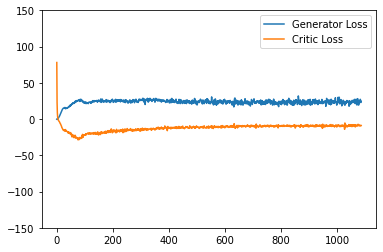

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  1120 35
Saved checkpoint


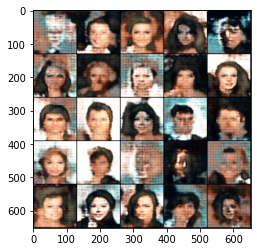

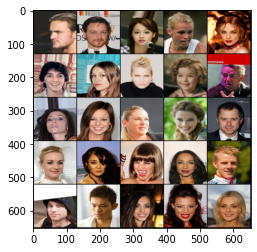

Epoch: 14: Step 1120: Generator loss: 24.42173925127302, critic loss: -9.137623912266324


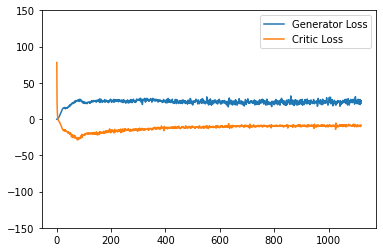

Saving checkpoint:  1155 35
Saved checkpoint


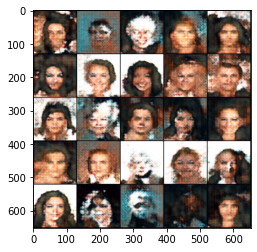

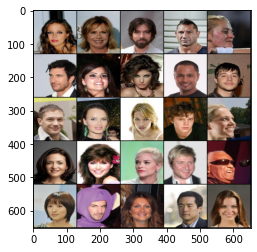

Epoch: 14: Step 1155: Generator loss: 23.873795754568917, critic loss: -8.874843270438058


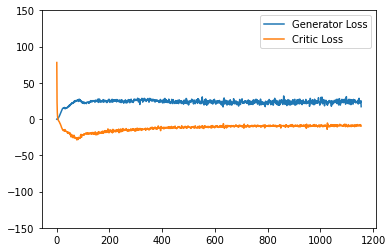

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  1190 35
Saved checkpoint


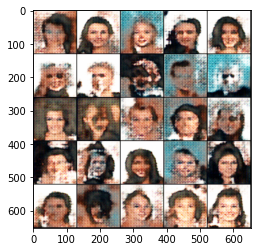

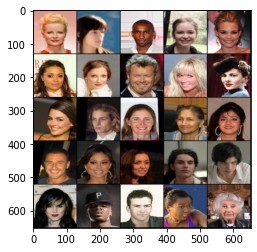

Epoch: 15: Step 1190: Generator loss: 24.32383292061942, critic loss: -8.62914066314697


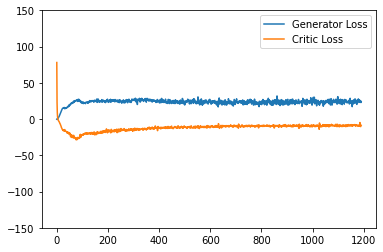

Saving checkpoint:  1225 35
Saved checkpoint


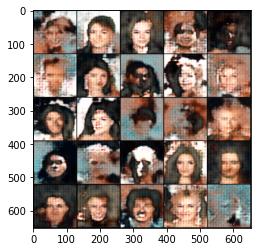

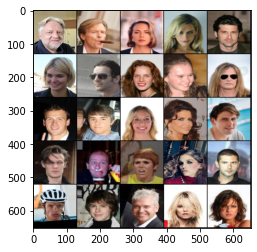

Epoch: 15: Step 1225: Generator loss: 24.26124289376395, critic loss: -8.693814351218089


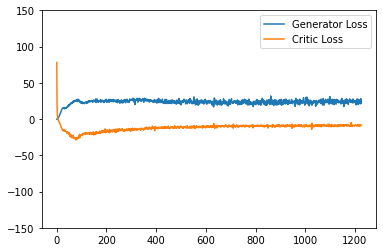

Saving checkpoint:  1260 35
Saved checkpoint


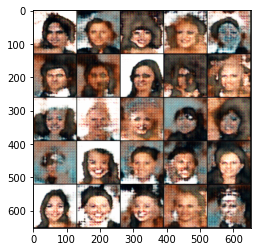

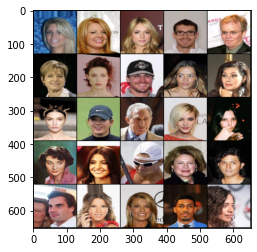

Epoch: 15: Step 1260: Generator loss: 23.770483834402903, critic loss: -8.572304887771608


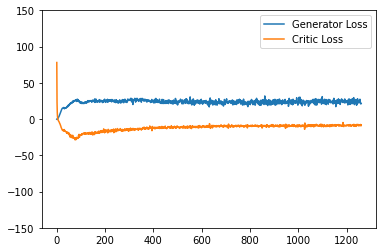

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  1295 35
Saved checkpoint


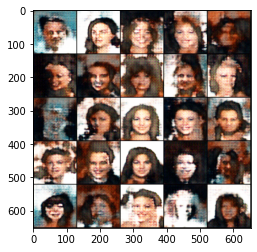

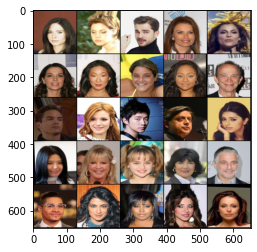

Epoch: 16: Step 1295: Generator loss: 24.29200804574149, critic loss: -8.42118285042899


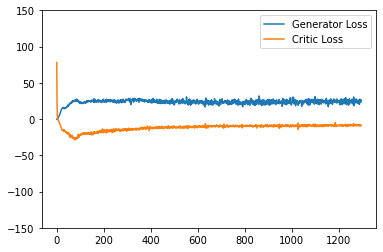

Saving checkpoint:  1330 35
Saved checkpoint


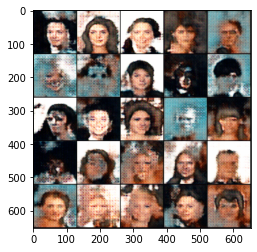

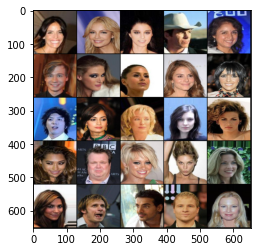

Epoch: 16: Step 1330: Generator loss: 24.25846219744001, critic loss: -8.313692626953124


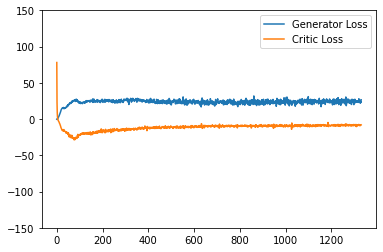

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  1365 35
Saved checkpoint


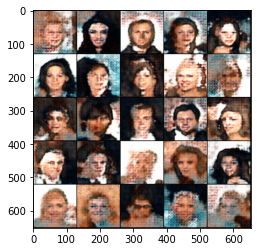

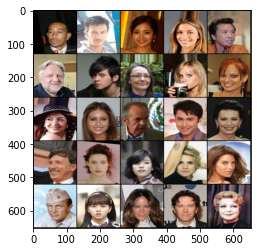

Epoch: 17: Step 1365: Generator loss: 23.86885185241699, critic loss: -8.304661994661606


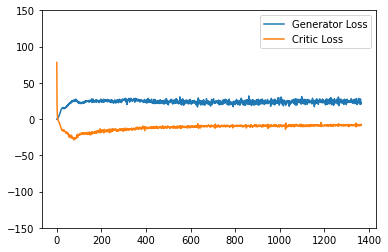

Saving checkpoint:  1400 35
Saved checkpoint


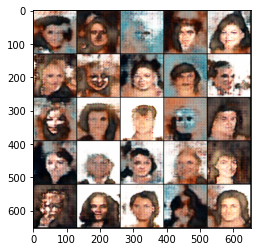

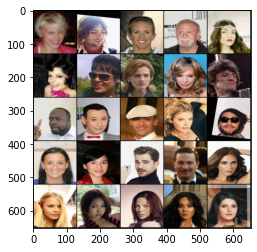

Epoch: 17: Step 1400: Generator loss: 23.81115651811872, critic loss: -8.263871966770717


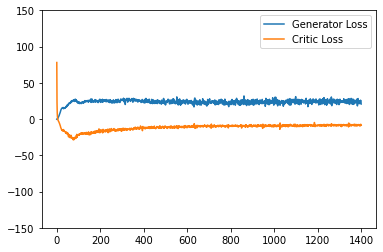

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  1435 35
Saved checkpoint


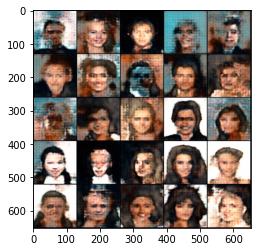

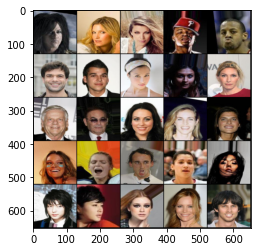

Epoch: 18: Step 1435: Generator loss: 24.54380395071847, critic loss: -8.108893162863595


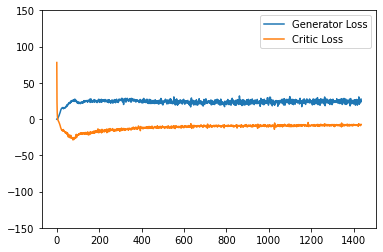

Saving checkpoint:  1470 35
Saved checkpoint


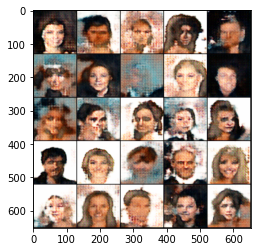

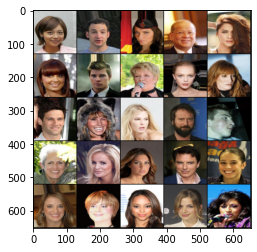

Epoch: 18: Step 1470: Generator loss: 24.012201854160853, critic loss: -7.9412744467599055


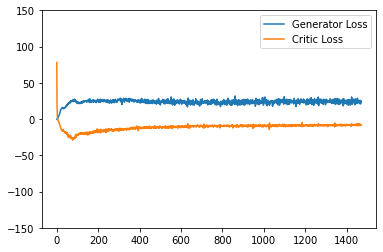

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  1505 35
Saved checkpoint


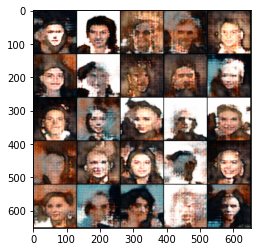

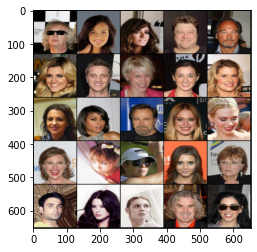

Epoch: 19: Step 1505: Generator loss: 23.374930027553013, critic loss: -7.776622913905554


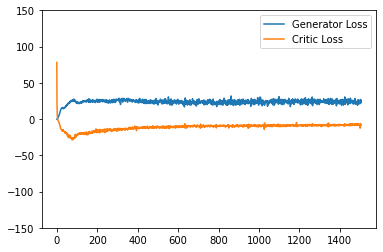

Saving checkpoint:  1540 35
Saved checkpoint


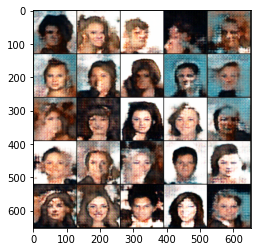

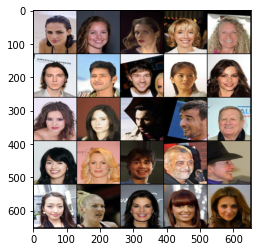

Epoch: 19: Step 1540: Generator loss: 23.99114946637835, critic loss: -8.022058680398123


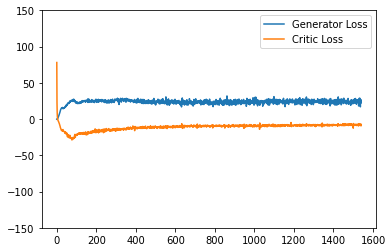

Saving checkpoint:  1575 35
Saved checkpoint


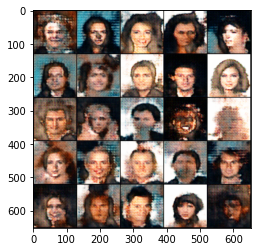

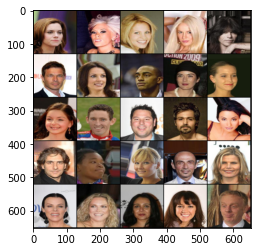

Epoch: 19: Step 1575: Generator loss: 23.711019570486886, critic loss: -7.702818698883058


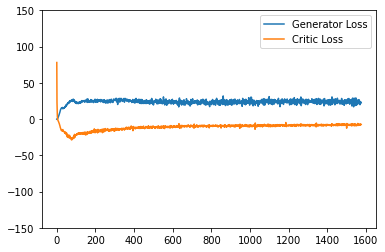

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  1610 35
Saved checkpoint


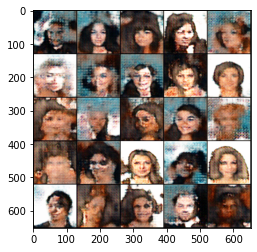

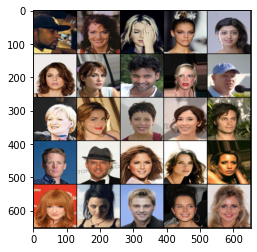

Epoch: 20: Step 1610: Generator loss: 23.926671818324497, critic loss: -7.830167880739485


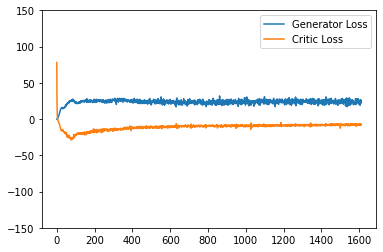

Saving checkpoint:  1645 35
Saved checkpoint


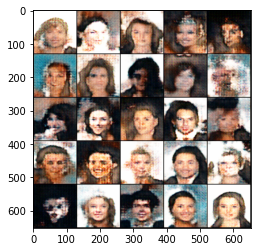

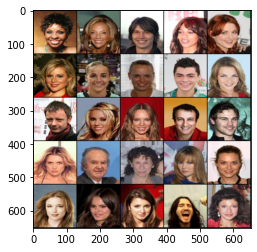

Epoch: 20: Step 1645: Generator loss: 23.232175990513394, critic loss: -7.687232755933492


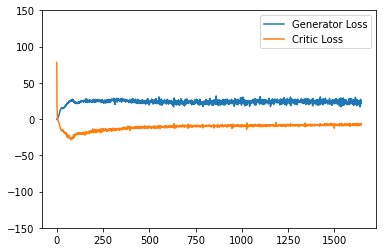

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  1680 35
Saved checkpoint


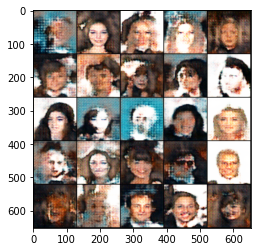

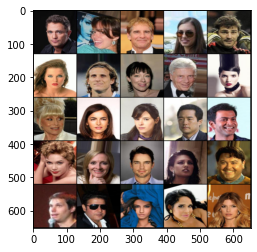

Epoch: 21: Step 1680: Generator loss: 23.293589728219168, critic loss: -7.861951709474836


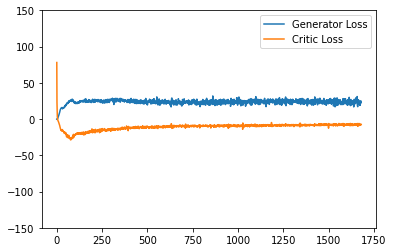

Saving checkpoint:  1715 35
Saved checkpoint


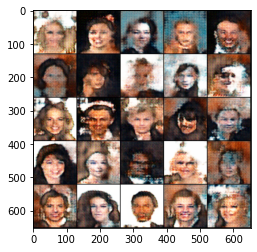

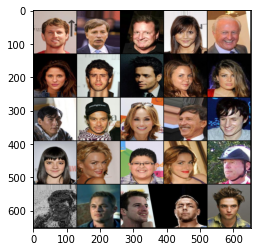

Epoch: 21: Step 1715: Generator loss: 24.158900124686106, critic loss: -7.547045606885637


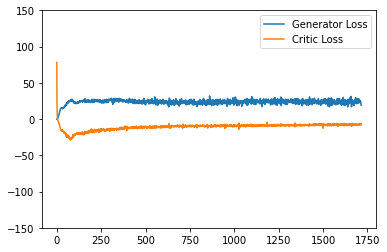

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  1750 35
Saved checkpoint


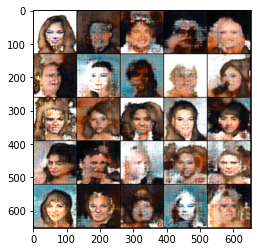

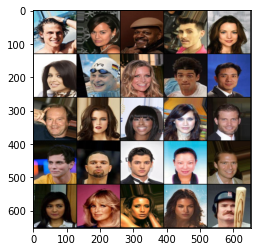

Epoch: 22: Step 1750: Generator loss: 23.78317794799805, critic loss: -7.564942565645491


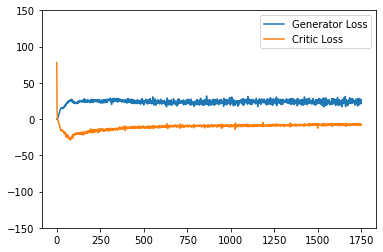

Saving checkpoint:  1785 35
Saved checkpoint


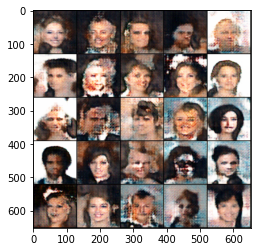

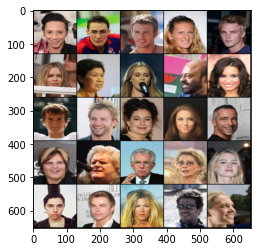

Epoch: 22: Step 1785: Generator loss: 23.346961648123607, critic loss: -7.585733158929007


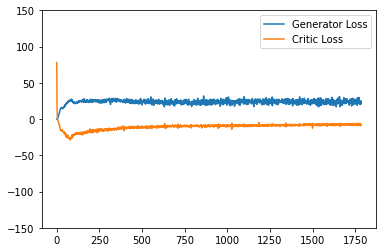

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  1820 35
Saved checkpoint


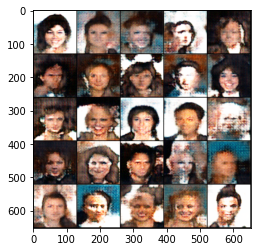

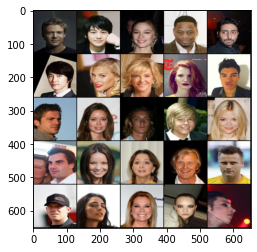

Epoch: 23: Step 1820: Generator loss: 23.93626834324428, critic loss: -7.261052216121129


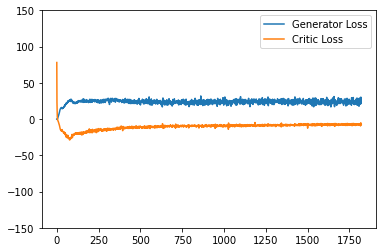

Saving checkpoint:  1855 35
Saved checkpoint


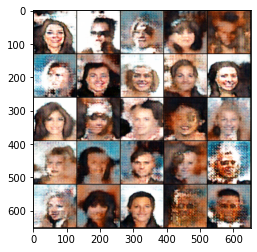

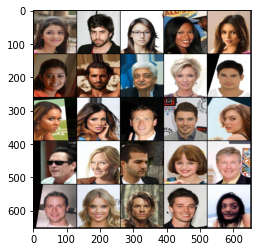

Epoch: 23: Step 1855: Generator loss: 23.62100056239537, critic loss: -7.600883669172013


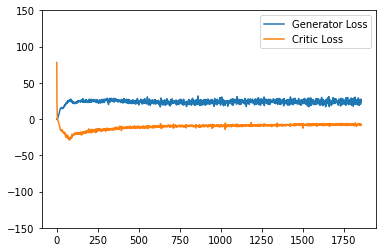

Saving checkpoint:  1890 35
Saved checkpoint


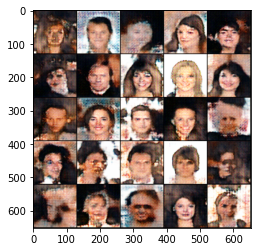

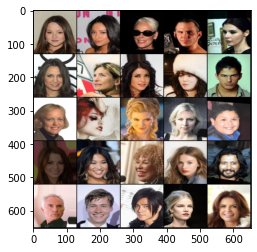

Epoch: 23: Step 1890: Generator loss: 22.989373397827148, critic loss: -7.316474764687676


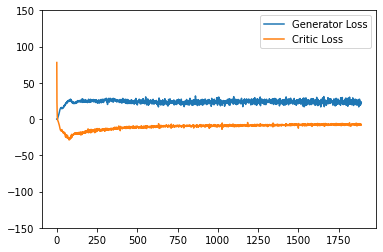

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  1925 35
Saved checkpoint


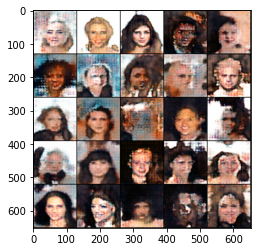

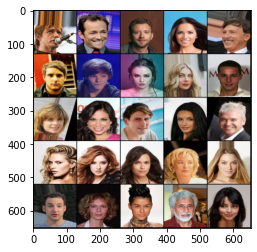

Epoch: 24: Step 1925: Generator loss: 22.88504442487444, critic loss: -7.213905771800451


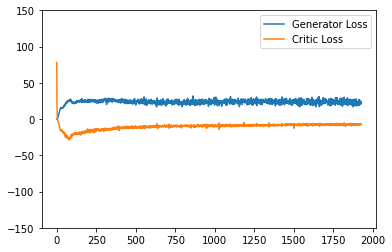

Saving checkpoint:  1960 35
Saved checkpoint


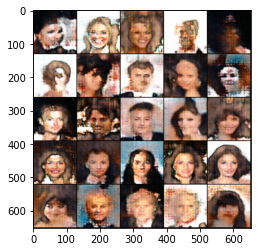

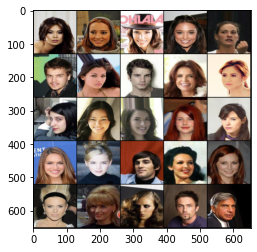

Epoch: 24: Step 1960: Generator loss: 22.935107585362026, critic loss: -7.380291994639806


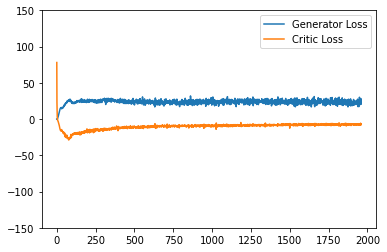

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  1995 35
Saved checkpoint


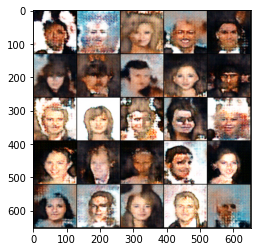

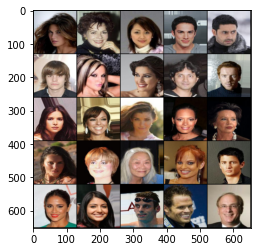

Epoch: 25: Step 1995: Generator loss: 23.554520307268415, critic loss: -7.31425157546997


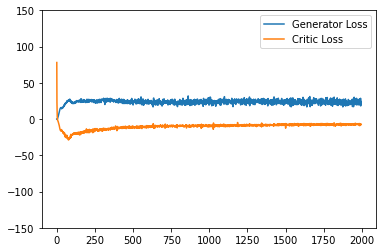

Saving checkpoint:  2030 35
Saved checkpoint


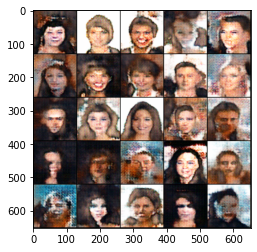

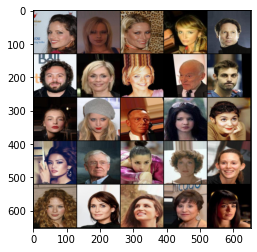

Epoch: 25: Step 2030: Generator loss: 23.06851496015276, critic loss: -7.06995913233076


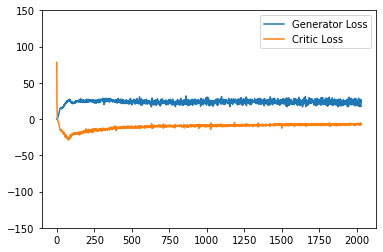

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  2065 35
Saved checkpoint


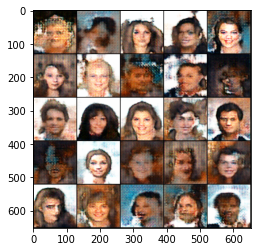

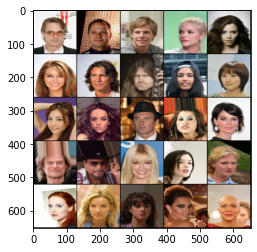

Epoch: 26: Step 2065: Generator loss: 23.167393384660993, critic loss: -7.1912804739815845


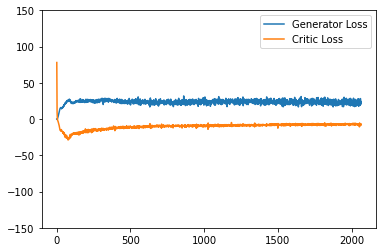

In [ ]:
# Training loop

for epoch in range(n_epochs):
    for real, _ in tqdm(dataloader):
        cur_bs = len(real)  # 128
        real = real.to(device)

        # CRITIC
        mean_crit_loss = 0
        for _ in range(crit_cycles):
            crit_opt.zero_grad()

            noise = gen_noise(cur_bs, z_dim)
            fake = gen(noise)
            crit_fake_pred = crit(fake.detach())
            crit_real_pred = crit(real)

            alpha = torch.rand(len(real), 1, 1, 1, device=device,
                               requires_grad=True)  # 128 x 1 x 1 x 1
            gp = get_gp(real, fake.detach(), crit, alpha)

            crit_loss = crit_fake_pred.mean() - crit_real_pred.mean() + gp

            mean_crit_loss += crit_loss.item() / crit_cycles

            crit_loss.backward(retain_graph=True)
            crit_opt.step()

        crit_losses += [mean_crit_loss]

        # GENERATOR
        gen_opt.zero_grad()
        noise = gen_noise(cur_bs, z_dim)
        fake = gen(noise)
        crit_fake_pred = crit(fake)

        gen_loss = -crit_fake_pred.mean()
        gen_loss.backward()
        gen_opt.step()

        gen_losses += [gen_loss.item()]

        # Stats

        if (wandbact == 1):
            wandb.log({'Epoch': epoch, 'Step': cur_step,
                      'Critic loss': mean_crit_loss, 'Gen loss': gen_loss})

        if cur_step % save_step == 0 and cur_step > 0:
            print("Saving checkpoint: ", cur_step, save_step)
            save_checkpoint("latest")

        if (cur_step % show_step == 0 and cur_step > 0):
            show(fake, wandbactive=1, name='fake')
            show(real, wandbactive=1, name='real')

            gen_mean = sum(gen_losses[-show_step:]) / show_step
            crit_mean = sum(crit_losses[-show_step:]) / show_step
            print(
                f"Epoch: {epoch}: Step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")

            plt.plot(
                range(len(gen_losses)),
                torch.Tensor(gen_losses),
                label="Generator Loss"
            )

            plt.plot(
                range(len(gen_losses)),
                torch.Tensor(crit_losses),
                label="Critic Loss"
            )

            plt.ylim(-150, 150)
            plt.legend()
            plt.show()

        cur_step += 1

# number of steps per epoch
# 10000 / 128 = 78.125
# 50000 / 128 = 390.625

In [ ]:
# Generate new faces
noise = gen_noise(batch_size, z_dim)
fake = gen(noise)
show(fake)

In [ ]:
plt.imshow(fake[16].detach().cpu().permute(1, 2, 0).squeeze().clip(0, 1))

In [ ]:
from mpl_toolkits.axes_grid1 import ImageGrid

# MORPHING, interpolation between points in latent space
gen_set = []
z_shape = [1, 200, 1, 1]
rows = 4
steps = 17

for i in range(rows):
    z1, z2 = torch.randn(z_shape), torch.randn(z_shape)
    for alpha in np.linspace(0, 1, steps):
        z = alpha*z1 + (1-alpha)*z2
        res = gen(z.cuda())[0]
        gen_set.append(res)

fig = plt.figure(figsize=(25, 11))
grid = ImageGrid(fig, 111, nrows_ncols=(rows, steps), axes_pad=0.1)

for ax, img in zip(grid, gen_set):
    ax.axis('off')
    res = img.cpu().detach().permute(1, 2, 0)
    res = res-res.min()
    res = res/(res.max()-res.min())
    ax.imshow(res.clip(0, 1.0))

plt.show()